In [1]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
from random import sample

image_folder = "/kaggle/input/swedish-traffic-signs-stsd/Set1Part0"
annotation_file = "/kaggle/input/swedish-traffic-signs-stsd/annotationsSet1.csv"

df = pd.read_csv(annotation_file)
invalid_bbox_mask = df['bbox'].apply(lambda bbox: eval(bbox) == [-1, -1, -1, -1])
df = df[~invalid_bbox_mask]
df = df.reset_index(drop=True)

In [2]:
label_mapping = {
    'PRIORITY_ROAD': 0,
    'PASS_EITHER_SIDE': 1,
    'PASS_RIGHT_SIDE': 2,
    'GIVE_WAY': 3,
    '70_SIGN': 4,
    '90_SIGN': 5,
    'OTHER': 6,
    '80_SIGN': 7,
    '50_SIGN': 8,
    'PEDESTRIAN_CROSSING': 9,
    '60_SIGN': 10,
    '30_SIGN': 11,
    'NO_PARKING': 12,
    'PASS_LEFT_SIDE': 13,
    '110_SIGN': 14,
    'STOP': 15,
    '100_SIGN': 16,
    'NO_STOPPING_NO_STANDING': 17,
    'URDBL': 18,
    '120_SIGN': 19
}

output_dir = "/kaggle/working/data/labels"
os.makedirs(output_dir, exist_ok=True)

def create_yolo_files(image_folder, df, label_mapping):
    for index, row in df.iterrows():
        image_name = row['image_name']
        image_path = os.path.join(image_folder, image_name)
        img = cv2.imread(image_path)
        img_height, img_width, _ = img.shape

        yolo_filename = os.path.join(output_dir, os.path.splitext(image_name)[0] + ".txt")
        
        with open(yolo_filename, "w") as yolo_file:
            rows_for_image = df[df['image_name'] == image_name]

            for _, row in rows_for_image.iterrows():
                bbox_list = eval(row['bbox'])
                label = row['sign_type']
                label_id = label_mapping[label]

                x_center = (bbox_list[0] + bbox_list[2]) / (2 * img_width)
                y_center = (bbox_list[1] + bbox_list[3]) / (2 * img_height)
                width = (bbox_list[2] - bbox_list[0]) / img_width
                height = (bbox_list[3] - bbox_list[1]) / img_height

                yolo_file.write(f"{label_id} {x_center} {y_center} {width} {height}\n")

create_yolo_files(image_folder, df, label_mapping)

In [3]:
!cp -r /kaggle/input/swedish-traffic-signs-stsd/Set1Part0 /kaggle/working/data/images

In [4]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16057, done.
remote: Total 16057 (delta 0), reused 0 (delta 0), pack-reused 16057
Receiving objects: 100% (16057/16057), 14.66 MiB | 31.81 MiB/s, done.
Resolving deltas: 100% (11028/11028), done.


In [5]:
!pip install -r yolov5/requirements.txt

  Obtaining dependency information for ultralytics>=8.0.147 from https://files.pythonhosted.org/packages/e6/27/90daa13a80ece0e45f693bbce0413f24f7f42bb7d08e4fd4fdc45f10febd/ultralytics-8.0.208-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 17.7 MB/s eta 0:00:0000:01


In [6]:
!cp /kaggle/input/my-yolo-voc-yaml/VOC.yaml /kaggle/working/yolov5/VOC.yaml

In [7]:
!python /kaggle/working/yolov5/train.py --img 640 --batch 16 --epochs 100 --data /kaggle/working/yolov5/VOC.yaml --weights yolov5s.pt --workers 2

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5s.pt, cfg=, data=/kaggle/working/yolov5/VOC.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=2, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date 

In [9]:
import torch

model = torch.hub.load('ultralytics/yolov5', 'custom',
                       path='/kaggle/working/yolov5/runs/train/exp/weights/best.pt',force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
requirements: Ultralytics requirement ['Pillow>=10.0.1'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 11.0s, installed 1 package: ['Pillow>=10.0.1']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 2023-11-10 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


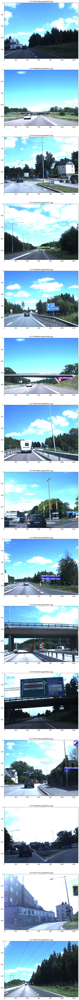

In [10]:
%matplotlib inline
import random
from matplotlib import pyplot as plt
import numpy as np
import cv2
import itertools
import os 

imgs = os.listdir('/kaggle/working/data/images')
random_images = random.sample(imgs, 15)

fig, axs = plt.subplots(15, 1, figsize=(20, 10 * 15))

for i, imgname in enumerate(random_images):
    img = cv2.imread(f'/kaggle/working/data/images/{imgname}')
    results = model(img)
    axs[i].imshow(cv2.cvtColor(np.squeeze(results.render()), cv2.COLOR_BGR2RGB))
    axs[i].set_title(imgname)
plt.show()

In [11]:
import shutil
shutil.make_archive("/kaggle/working/yolov5", 'zip', "/kaggle/working", "/kaggle/working/yolov5")

'/kaggle/working/yolov5.zip'